<a href="https://colab.research.google.com/github/lleviraz/urban_segmentation/blob/main/notebooks/UNET_Final_Proj_Segmentation_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segmentation of Residential and Non Residential Built-Up areas using UNET

(Sentienl2 satellite images with ESM masks)

This notebook contains the Segmentation pipeline using fastai
It assumes that the dataset was already preprocessed and available 
in two directories:
- s2_resized - the input images
- esm_aligned - the ESM masks

It will create 3 new directories:
- s2_resized_test - test samples not used in training, nor validation
- esm_resized_test - masks of the above test images (unused)
- preds - predicted masks based on test data

By: Eli T. and Liad.L.

In [1]:
import warnings
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install fastai wwf nbdev rasterio geopandas fastbook tiffile imagecodecs pytorch-ignite -q
from wwf.utils import state_versions
state_versions(['fastai', 'fastcore', 'wwf','fastbook','torch','torchvision','rasterio','pytorch-ignite'])


---
This article is also a Jupyter Notebook available to be run from the top down. There
will be code snippets that you can then run in any environment.

Below are the versions of `fastai`, `fastcore`, `wwf`, `fastbook`, `torch`, `torchvision`, `rasterio`, and `pytorch-ignite` currently running at the time of writing this:
* `fastai` : 2.6.3 
* `fastcore` : 1.4.3 
* `wwf` : 0.0.16 
* `fastbook` : 0.0.26 
* `torch` : 1.11.0+cu113 
* `torchvision` : 0.12.0+cu113 
* `rasterio` : 1.2.10 
* `pytorch-ignite` : 0.4.9 
---

In [3]:
# Python General
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
from pathlib import Path
import glob
from tqdm.notebook import tqdm
import pprint as pp
from PIL import Image
import numpy as np

#Torch
from torch import nn
import torch
import torch.nn.functional as F
from torchvision.transforms import *
from torchvision.transforms.functional import InterpolationMode
# from torchvision.models.resnet import resnet18,resnet34,resnet50,resnet101,wide_resnet50_2,resnext101_32x8d
from torchvision.models.resnet import resnet34,resnet50
#TODO try these two architechtures!!!
from torchvision.models.segmentation import deeplabv3_resnet50,fcn_resnet50
from ignite.metrics import SSIM


#rasterio
import rasterio as rio
from rasterio.transform import Affine
from rasterio.plot import show_hist,show
from rasterio.warp import calculate_default_transform, reproject, Resampling

#fastai
from fastcore.xtras import Path
from fastai.callback.hook import summary
from fastai.callback.progress import ProgressCallback
from fastai.callback.schedule import lr_find, fit_flat_cos
from fastai.data import *
from fastai.data.block import DataBlock
from fastai.data.external import untar_data, URLs
from fastai.data.transforms import get_image_files, FuncSplitter, Normalize
from fastai.layers import Mish
from fastai.losses import BaseLoss,DiceLoss,FocalLossFlat
from fastai.optimizer import ranger,Adam
from fastai.torch_core import tensor
from fastai.vision.all import *
from fastai.vision.augment import aug_transforms
from fastai.vision.learner import unet_learner
from fastai.vision import *
from fastai.vision.core import *
from fastai.vision.data import *
from fastai.basics import *

In [4]:
import torch
import random
torch.manual_seed(42)
random.seed(42)
np.random.seed(42)

In [5]:
EXPORT_DIR='/content/drive/MyDrive/2022/S1/3624_Final_Project/dataset'
LOCAL_EXPORT_DIR='/content/'
EXPORT_DIR = LOCAL_EXPORT_DIR
os.chdir('/content/drive/MyDrive/2022/S1/3624_Final_Project/notebooks')
sys.path.append('/content/drive/MyDrive/2022/S1/3624_Final_Project/notebooks')

ESM_DIR = EXPORT_DIR + '/ESM'
S2_DIR = EXPORT_DIR + '/S2'

esm_aligned = os.path.join(EXPORT_DIR ,'esm_aligned/')
s2_resized = os.path.join(EXPORT_DIR,'s2_resized/')

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# device = 'cpu' #GOOD FOR DEBUGGING
print('Using device:', device)

Using device: cuda


In [7]:
!cp -r -n /content/drive/MyDrive/2022/S1/3624_Final_Project/dataset/s2_resized /content/
!cp -r -n /content/drive/MyDrive/2022/S1/3624_Final_Project/dataset/s2_resized_test /content/
!cp -r -n /content/drive/MyDrive/2022/S1/3624_Final_Project/dataset/esm_aligned /content/
!cp -r -n /content/drive/MyDrive/2022/S1/3624_Final_Project/dataset/esm_aligned_test /content/

## Validate Dataset

Validate that the generated masks and plot some samples of the transformed MASKs with original and matching image

Note: the class proprtions are saved, except for the 'no-data' at the margins (white triangle areas), which are minimized due to the alignment.

In [8]:
from libs.preprocess import *
from libs.metrics import *
from libs.multichannel import *
from libs.metrics import _fast_hist


orig_mask,new_mask,orig_img = None,None,None
#Uncomment to run validation
# orig_mask,new_mask,orig_img = validate_dataset(s2_resized,esm_aligned,ESM_DIR)

In [9]:
if (new_mask != None):
  print('---------------------------------')
  print(orig_mask.name,'\n',orig_mask.meta)
  print('---------------------------------')
  print(new_mask.name,'\n',new_mask.meta)
  print('---------------------------------')
  print(orig_img.name,'\n',orig_img.meta)
  print('---------------------------------') 

## Segmenation Experiments


## Create test set 

Save some images (and their matching labels) for test

In [10]:
# !ls ../dataset/s2_resized_test | wc -l
# !ls ../dataset/esm_aligned_test/ | wc -l

In [11]:
# ! mv ../dataset/s2_resized_test/*.tif ../dataset/s2_resized
# ! mv ../dataset/esm_aligned_test/*.tif ../dataset/esm_aligned

In [12]:
# !rm -rf ../dataset/s2_resized_test/
# !rm -rf ../dataset/esm_aligned_test/

In [13]:
import shutil
S2_TEST_DIR = os.path.join(EXPORT_DIR,'s2_resized_test')
ESM_TEST_DIR = os.path.join(EXPORT_DIR,'esm_aligned_test')

def create_test_set():

  if(os.path.isdir(S2_TEST_DIR)):
    print('{} Directory exists,\n exiting. (To recreate, move files back to original dirs BEFORE DELETING(!!!) and rerun)'.format(S2_TEST_DIR))
    target = os.listdir(S2_TEST_DIR)
    number_files = len(target)
    print(number_files)
  else:
    print('Creating ',S2_TEST_DIR)
    print('Creating ',ESM_TEST_DIR)
    os.makedirs(S2_TEST_DIR)
    os.makedirs(ESM_TEST_DIR)
    s2_source = s2_resized
    esm_source = esm_aligned
    files = os.listdir(s2_source)
    no_of_files = 50#int(len(files) *0.07)

    for file_name in random.sample(files, no_of_files):
        shutil.move(os.path.join(s2_source, file_name), S2_TEST_DIR)
        shutil.move(get_matching_mask_path(file_name,esm_source), ESM_TEST_DIR)

create_test_set()

/content/s2_resized_test Directory exists,
 exiting. (To recreate, move files back to original dirs BEFORE DELETING(!!!) and rerun)
50


In [14]:
trn = glob.glob(os.path.join(s2_resized,'*.tif'))
trn_number_files = len(trn)
print('{} train files in {}'.format(trn_number_files,s2_resized))
tst = glob.glob(os.path.join(S2_TEST_DIR,'*.tif'))
tst_number_files = len(tst)
print('{} test files in {}'.format(tst_number_files,S2_TEST_DIR))

650 train files in /content/s2_resized/
50 test files in /content/s2_resized_test


In [15]:
#check a sample of the expected image and matching mask both ways
sample_mask = get_matching_mask_path(trn[0],esm_aligned)
assert sample_mask != None
sample_image = get_matching_img_path(sample_mask,s2_resized)
assert sample_image != None

## Segmentation of Multi Channel Tiff Images

Custom Classes:

 - MCISegmentationDataLoaders - an extension of fastai's [SegmentationDataLoaders](https://docs.fast.ai/vision.data.html#SegmentationDataLoaders) to support multi channel Tiff images 
 - MultiChannelImage  - Enhancing the basic [TensorImage](https://docs.fast.ai/torch_core.html#TensorImage) 

Both classes are defined in `libs.multichannel.py`


In [16]:
fnames = get_image_files(s2_resized)
lbl_names = get_image_files(esm_aligned)
fnames,lbl_names

((#650) [Path('/content/s2_resized/R_7_604.tif'),Path('/content/s2_resized/R_4_397.tif'),Path('/content/s2_resized/R_2_115.tif'),Path('/content/s2_resized/R_5_469.tif'),Path('/content/s2_resized/R_3_202.tif'),Path('/content/s2_resized/R_3_245.tif'),Path('/content/s2_resized/R_4_353.tif'),Path('/content/s2_resized/R_6_585.tif'),Path('/content/s2_resized/R_6_543.tif'),Path('/content/s2_resized/R_5_460.tif')...],
 (#650) [Path('/content/esm_aligned/ESM_197.tif'),Path('/content/esm_aligned/ESM_144.tif'),Path('/content/esm_aligned/ESM_535.tif'),Path('/content/esm_aligned/ESM_262.tif'),Path('/content/esm_aligned/ESM_176.tif'),Path('/content/esm_aligned/ESM_184.tif'),Path('/content/esm_aligned/ESM_516.tif'),Path('/content/esm_aligned/ESM_39.tif'),Path('/content/esm_aligned/ESM_356.tif'),Path('/content/esm_aligned/ESM_279.tif')...])

## Classes 

codes decoder dictionary (0,1,2,3)->(0,1,250,255)

In [17]:
# From np.unique(mask)
code2class = {0:0,1:1,2:250,3:255}
class2code={0:0,1:1,250:2,255:3}

In [18]:
def get_msk(img_name,mask_dir, p2c=code2class,merge_bg=False):
  '''
  returns a matching mask for an image using the codes decoder dictionary (0,1,2,3)->(0,1,250,255)
  '''
  fn = get_matching_mask_path(img_name,mask_dir)
  msk = np.array(PILMask.create(fn))

  for i, val in enumerate(p2c):
    msk[msk==p2c[i]] = val
  if(merge_bg):
    msk[msk==0] = 1
  msk[0,0]=0 #save one pixel as 0 to preseve the "colors" when comparing
  return PILMask.create(msk)

In [19]:
img_fn = fnames[1].name
msk = get_msk(img_fn,esm_aligned,code2class)
# msk2 = get_msk(img_fn,esm_aligned,code2class)#,merge_bg=True)

(array([0, 1, 2, 3], dtype=uint8), array([  530, 68136,   224, 21110]))

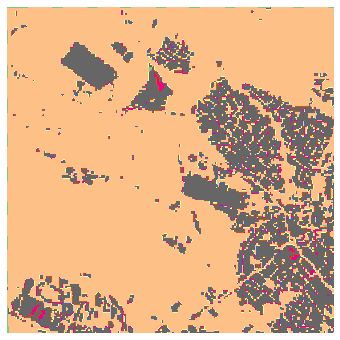

In [20]:
cm='Accent' #'nipy_spectral_r'
f,axs = plt.subplots(1,1,figsize=(6,6))
msk.show(figsize=(5,5), alpha=1.,cmap=cm,ax=axs)
# msk2.show(figsize=(5,5), alpha=1.,cmap=cm,ax=axs[1])
np.unique(tensor(msk),return_counts=True)#,np.unique(tensor(msk2),return_counts=True)

In [21]:
#Tensor mask with coded values (0,1,2,3)
tensor(msk)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [0, 0, 1,  ..., 1, 1, 3],
        [0, 0, 1,  ..., 3, 3, 3],
        [0, 0, 1,  ..., 3, 3, 1]], dtype=torch.uint8)

In [22]:
# name2id = {v:k for k,v in enumerate(codes)}
# name2id

In [23]:
# no_data_code = name2id['3_0_No_Data']
# no_data_code

## Metrics: IoU (Jaccard Index) ,Dice Score , Accuracy

In [24]:
def overall_acc(inp, targ):
  '''
  Overall pixel accuracy (not a good metric...)
  '''
  hist = prep_hist(inp,targ)
  return overall_pixel_accuracy(hist)

In [25]:
def per_cls_acc(inp, targ):
  '''
  Per class pixel accuracy (not a bad metric...)
  '''
  hist = prep_hist(inp,targ)
  return per_class_pixel_accuracy(hist)

In [26]:
def iou(inp, targ):
  '''
  IoU - Intersection over Union , Jaccard index
  '''
  hist = prep_hist(inp,targ)
  return jaccard_index(hist)

In [27]:
def dice(inp, targ):
  '''
  Calculates the Dice coefficient between two images
  '''
  hist = prep_hist(inp,targ)
  return dice_coefficient(hist)

In [28]:
def foreground_acc(inp, targ, bkg_idx=1, axis=1):
    "Computes non-background accuracy for multiclass segmentation without the background class" 
    targ = cast(targ.squeeze(1), TensorBase)
    mask = targ != bkg_idx
    return (inp.argmax(dim=axis)[mask]==targ[mask]).float().mean()

## A Combined Loss function

A combined loss DiceLoss + Focal loss, that takes care of the class imbalance in the dataset https://docs.fast.ai/losses.html

Tuning the "gamma" and "alpha" hyperparams is critical.

FocalLoss: https://amaarora.github.io/2020/06/29/FocalLoss.html

Inspiration from this paper:
[Unified Focal loss: Generalising Dice and cross entropy-based losses to handle class imbalanced medical image segmentation](https://paperswithcode.com/paper/a-mixed-focal-loss-function-for-handling )


\begin{equation}
CrossEntropyFlat=CEF=
    \begin{cases}
      -log(p) & \text{if y=1} \\
      -log(1-p) & \text{otherwise}
    \end{cases}
\end{equation}  

With Focal loss, for $p_t$, the probability of a given class $t$, the loss functions we used are defined as:

\begin{equation}
p_t=
    \begin{cases}
      p & \text{if y=1} \\
      1-p & \text{otherwise}
    \end{cases}
\end{equation} 

$FocalLoss=FL(p_t)=-\alpha_t(1-p_t)^{\gamma}log(p_t)$
- Focal Loss is the same as cross entropy except easy-to-classify observations are down-weighted in the loss calculation. The strength of down-weighting is proportional to the size of the gamma parameter. Put another way, the larger gamma the less the easy-to-classify observations contribute to the loss.
- Where $\gamma > 0$. When $\gamma = 1$ Focal Loss works like Cross-
Entropy loss function. Similarly, $\alpha$ generally range from [0,1], as a hyperparameter.

$DiceLoss=DL(y,\hat{p})= 1 - {2y\hat{p} +1  \over y + \hat{p} + 1}$

- The Dice coefficient is widely used metric in computer
vision community to calculate the similarity between two
images. Later in 2016, it has also been adapted as loss function
known as Dice Loss

$CombinedFocalDice=FL+\alpha(DL)$

To balance between global (Dice) and local (Focal) features on the target mask.

Code is at: `libs.multichannel.py`

In [29]:
#Training images dir
TRAIN = s2_resized

## Augmentations

Required for multi channel images (and their masks) using [Albumenations](https://albumentations.ai/docs/examples/example_kaggle_salt/#Using-Albumentations-for-a-semantic-segmentation-task)

In [30]:
#DEBUG / TEST trying to apply the dataset statistics values
# stats_mean_df = pd.read_csv('stats_mean_df.csv',index_col=0,header=0)
# stats_std_df  = pd.read_csv('stats_std_df.csv',index_col=0,header=0)

# means=list(stats_mean_df.mean().values)
# stds=list(stats_std_df.mean().values)
# s2_stats = (means,stds)

In [31]:
#TODO move to multichannel.py
#Trying Albumenations as regular torch Augmentations support only 3 channels
import albumentations as A
width=300
height=300
class SegmentationAlbumentationsTransform(ItemTransform):
    split_idx = 0
    
    def __init__(self, aug): self.aug = aug
    def encodes(self, x):
        img,mask = x

        # for albumentations to work correctly, the channels must be at the last dimension
        aug = self.aug(image=np.array(img.permute(1,2,0)), mask=np.array(mask))
        return TensorImage(aug['image'].transpose(2,0,1)), TensorMask(aug['mask'])

ppp=0.5
#From https://albumentations.ai/docs/examples/example_kaggle_salt/#Using-Albumentations-for-a-semantic-segmentation-task
#Half size is a popular choice of augmenation for segmentation tasks
aug_pipe = A.Compose([A.RandomSizedCrop(min_max_height=(150, 150), height=height, width=width, p=ppp),
    A.PadIfNeeded(min_height=height, min_width=width, p=1),
    A.VerticalFlip(p=ppp),
    A.RandomRotate90(p=ppp),
    A.RandomBrightnessContrast(p=ppp)]
    )


# Create our class with this aug_pipe
aug = SegmentationAlbumentationsTransform(aug_pipe)


In [32]:
augs_list = []
for a in aug_pipe:
  augs_list.append(a.__class__.__name__)
augs_list

['RandomSizedCrop',
 'PadIfNeeded',
 'VerticalFlip',
 'RandomRotate90',
 'RandomBrightnessContrast']

## Hyperparams

In [33]:
####################################
### Combined Focal and Dice Loss ###
####################################
#======================================================================================
#GREAT RESULTS: |1. alpha=0.1,gamma=6
#======================================================================================
loss_fn=CombinedLoss(alpha=0.1,gamma=6)

#######################
###  DiceLoss  Only ###
#######################
#loss_fn = DiceLoss(reduction="mean")
#Very bad - no learning at all

######################
### FocalLoss Only ###
######################
#axis=1,gamma=2.0
# loss_fn=FocalLossFlat(axis=1,gamma=6)
#although getting very low losses of ~0.06 - this is sometimes missing entire classes - and giving an overall lower scores
# when gamm is default , 2.0 - this is same as CE - it totally mixes entire classes (switches the pred of class 1 with 250)

#################
### CELoss ###
#################
#pass weights of each class from the EDA
# weights = torch.tensor([1e-07,0.70,0.05,0.25]).cuda()
# loss_fn = CrossEntropyLossFlat(weight=weights, axis=1)
# loss_fn=CrossEntropyLossFlat(axis=1) #Show that this is not a good LOSS for segmentation (without weights at least)
# RESULTS: cross-entropy is segmenting too small areas and has the worst scores performance (which makes sense for imbalanced dataset)
# it totally mixes entire classes (switches the pred of class 1 with 250)

In [34]:
#Other hyper parameters

model='unet_fastai'

#DataLoader and Learner 
batch_size=5
num_epochs=200
arch= resnet101 #deeplabv3_resnet50 
opt=ranger #Adam
#based on feature selection in EDA
#channels=[13,14,15] #crashes when 15 is added in Trio
# pretrained=True

pretrained=False #can be True only if using 3 channels
channels=None
# normalize_input=True
normalize_input=False
num_chan=len(channels) if channels!=None else None

# lr=0.0 #will be automatically set by lr_find
valid_pct=0.10

#AUGMENTATIONS
item_augms = aug

# batch_augms = Normalize.from_stats(*s2_stats) #[RandomHorizontalFlip(p=ppp),RandomVerticalFlip(p=ppp)]
batch_augms=None #Normalize.from_stats(*s2_stats)#None


In [35]:
TRAIN = s2_resized

dl_train = MCISegmentationDataLoaders.from_label_func_segm(chans=channels,path=TRAIN, bs=batch_size,
                          codes=list(code2class.keys()),
                          fnames=get_files(TRAIN, extensions=['.tif'], recurse=False),
                          label_func = lambda o: get_msk(o.name,esm_aligned, code2class),
                          item_tfms=item_augms,batch_tfms=batch_augms,valid_pct=valid_pct)

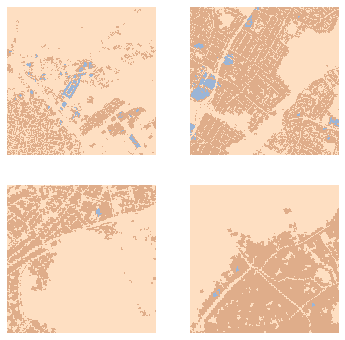

In [36]:
cm='Accent'
dl_train.show_batch(max_n=4,figsize=(6,6),cmap=cm)

In [37]:
print(dl_train.train.items[0], dl_train.valid.items[0])
print(len(dl_train.valid.items),len(dl_train.train.items))


/content/s2_resized/R_2_112.tif /content/s2_resized/R_7_675.tif
65 585


## UNET (unet_learner, fastai)

https://docs.fast.ai/vision.learner.html#unet_learner

In [38]:
if num_chan==None:
  num_chan=15
nn_out=len(list(code2class.keys()))
learn = unet_learner(dl_train, n_in=num_chan, n_out=nn_out,pretrained=pretrained,model_dir='../../models/',
                     arch=arch,metrics=[overall_acc,per_cls_acc,iou,dice,DiceMulti,foreground_acc],
                     self_attention=True,
                     loss_func=loss_fn,
                     act_cls = Mish,
                     opt_func=opt,
                     normalize=normalize_input).to_fp16()



In [39]:
# learn.summary()

In [40]:
learn.summary()

DynamicUnet (Input shape: 5 x 15 x 300 x 300)
Layer (type)         Output Shape         Param #    Trainable 
                     5 x 64 x 150 x 150  
Conv2d                                    47040      True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     5 x 64 x 75 x 75    
MaxPool2d                                                      
Conv2d                                    4096       True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
____________________________________________________________________________
                     5 x 256 x 75 x 75   
Conv2d                                    16384      True      
BatchNorm2d                       

In [41]:
from datetime import datetime
now = datetime.now()
# dd/mm/YY H:M:S
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("date and time =", dt_string)

date and time = 23/05/2022 10:32:20


In [42]:
# final_states_dict_file = Path('../models/final_model.pth')
final_states_dict_file = Path('../models/new_last_model.pth_INGORE')
INFERECE_MODE=final_states_dict_file.is_file()

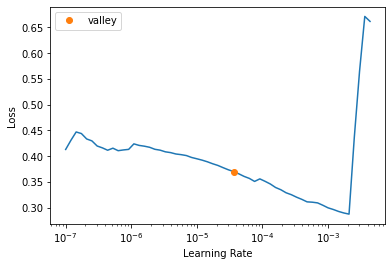

In [43]:
if(INFERECE_MODE):
  print('Inference mode: skipping training, loading model states dict...')
  learn.load_state_dict(torch.load(final_states_dict_file),strict=False)
else:
  l = learn.lr_find()

In [44]:
if(not INFERECE_MODE):
  min_grad_lr = l.valley
  min_grad_lr

In [ ]:
# learn.unfreeze()
# learn.fit_one_cycle(num_epochs,min_grad_lr,
#                     cbs=[SaveModelCallback(),
#                     EarlyStoppingCallback(monitor='valid_loss', patience=15)])

In [ ]:
if(INFERECE_MODE):
  print('Inference mode, skip training')
else:
  learn.fit_flat_cos(num_epochs,lr=min_grad_lr,
                    #  cbs=[SaveModelCallback(monitor='dice_multi',comp=np.greater),
                         cbs=[SaveModelCallback(),
                          EarlyStoppingCallback(monitor='valid_loss', patience=10),
                          ReduceLROnPlateau( patience=3)])
  


epoch,train_loss,valid_loss,overall_acc,per_cls_acc,iou,dice,dice_multi,foreground_acc,time
0,0.158212,0.129745,0.730701,0.446218,0.356699,0.462445,0.574167,0.544883,03:00
1,0.132873,0.119703,0.745854,0.472791,0.384624,0.498055,0.582085,0.514221,03:00
2,0.129522,0.118130,0.754280,0.570016,0.443512,0.575078,0.661117,0.656238,03:00
3,0.125836,0.117780,0.753195,0.584031,0.451143,0.585304,0.660783,0.516400,03:00
4,0.118155,0.110249,0.767819,0.530887,0.433138,0.555212,0.643491,0.635105,03:00


Better model found at epoch 0 with valid_loss value: 0.1297450214624405.
Better model found at epoch 1 with valid_loss value: 0.11970315873622894.
Better model found at epoch 2 with valid_loss value: 0.11812959611415863.
Better model found at epoch 3 with valid_loss value: 0.11778035759925842.
Better model found at epoch 4 with valid_loss value: 0.1102491095662117.


In [ ]:
#this is not showing the best values -  just the last ones...

log = learn.recorder.log
log

(#9) [0,None,None,None,None,None,nan,None,'00:01']

In [ ]:
learn.recorder.log

(#9) [0,None,None,None,None,None,nan,None,'00:01']

In [ ]:
if(INFERECE_MODE):
  print('Inference mode')
else:
  learn.recorder.plot_loss()

Inference mode


In [ ]:
if(INFERECE_MODE):
  print('Inference mode')
else:
  learn.recorder.plot_metrics()

Inference mode


In [ ]:
#learning rate scheduleing plot
if(INFERECE_MODE):
  print('Inference mode')
else:
  learn.recorder.plot_sched()

Inference mode


In [ ]:
# interp.plot_confusion_matrix(figsize=(6,6), dpi=100)

## Store results of experiments and save to a log


In [ ]:
if(INFERECE_MODE):
  print('Inference mode')
else:
  cols=['datetime','model','num_epochs','loss_fn','batch_size',
      'arch','optim','channels','pretrained','lr','valid_pct',
      'trn_loss','val_loss','acc','per_cls_acc','IoU','Dice','DiceMulti', 'foreground_acc','item_augs','batch_augs','epoch_time']
  results=pd.DataFrame(columns=cols)
  if loss_fn.__class__.__name__.startswith('CombinedLoss'):
    loss_display = loss_fn.display()
  else:
    loss_display=(loss_fn.__class__.__name__)
  new_expriment_log=[dt_string,model,log[0],loss_display,batch_size,
      arch.__name__,opt.__name__,channels,pretrained,min_grad_lr,valid_pct,
      log[1],log[2],log[3],log[4],log[5],log[6],log[7],log[8],augs_list,batch_augms,log[-1]]

  results.loc[len(results)] = new_expriment_log
  results

Inference mode


In [ ]:
if(INFERECE_MODE):
  print('Inference mode')
else:
  results.to_csv('logs/results_log.csv', mode='a', index=False, header=False)


Inference mode


## Inference - Display some results

In [ ]:
# Learner.dls = dl_train

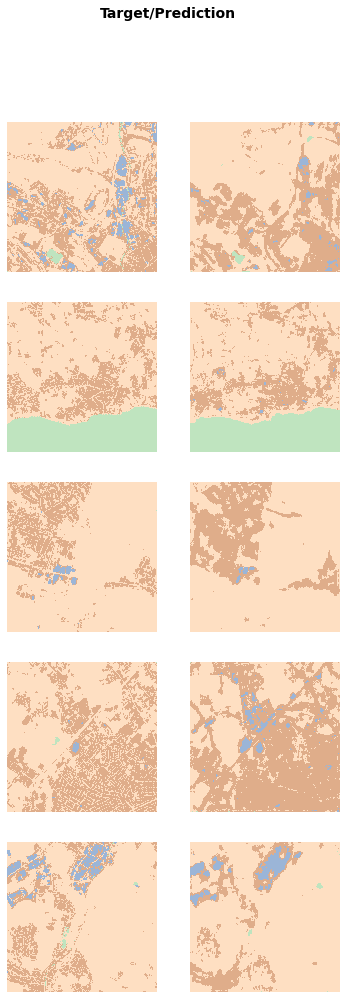

In [ ]:
#TODO see if we can plot the image behind the masks...
cm='Accent' #'nipy_spectral_r'
learn.show_results(max_n=6, figsize=(6,16),cmap=cm)

## Compare class proprtions , similiarity of original and generated masks

First "predict" a mask for all the **training** data

In [ ]:
import gc
gc.collect()
# !pwd

297

In [ ]:
#clean old predicted filed
# PREDS_DIR= 'preds'
PREDS_DIR= '/content/preds'
!mkdir -p {PREDS_DIR} && ls {PREDS_DIR} | wc -l && rm -f {PREDS_DIR}/*.tif

0


In [ ]:
train_fnames = get_image_files(s2_resized)

dl = learn.dls.test_dl(train_fnames)
preds = learn.get_preds(dl=dl)
print(preds[0].shape)


torch.Size([650, 4, 300, 300])


In [ ]:
BU_PROP='BU_prop'
c250_IN_BU = 'p250_in_bu'
c255_IN_BU ='p255_in_bu'

The following dataframe has 3 types of rows: 
- ORIG - original mask statistics
- PRED - predicted mask statistics
- DIFF - the difference between the Original and the Mask

Every 3 sequential rows represent a single "tuple" of (image,orig mask, pred mask)

In [ ]:
pred_prop_df = build_proportions_df(train_fnames,preds[0],esm_aligned,code2class)
pred_prop_df.head(6)

0it [00:00, ?it/s]

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
0,ORIG,R_7_604.tif,ESM_604.tif,5796,35853,1185,47166,0.537233,0.024508,0.975492
1,PRED,R_7_604.tif,ESM_604.tif,2730,29511,1726,56033,0.641767,0.029883,0.970117
2,DIFF,R_7_604.tif,ESM_604.tif,3066.0,6342.0,541.0,8867.0,0.104533,0.005375,0.005375
3,ORIG,R_4_397.tif,ESM_397.tif,530,68136,224,21110,0.237044,0.010500,0.989500
4,PRED,R_4_397.tif,ESM_397.tif,50,68436,2831,18683,0.239044,0.131589,0.868411
5,DIFF,R_4_397.tif,ESM_397.tif,480.0,300.0,2607.0,2427.0,0.002000,0.121089,0.121089


In [ ]:
BEST_THRESH=0.05
WORST_THRESH=0.3

orig_only_df = pred_prop_df.where(pred_prop_df['type']=='ORIG').dropna()
pred_only_df = pred_prop_df.where(pred_prop_df['type']=='PRED').dropna()
diff_only_df = pred_prop_df.where(pred_prop_df['type']=='DIFF').dropna()
display(diff_only_df.describe())
sum(diff_only_df.BU_prop > WORST_THRESH),display(diff_only_df)

,BU_prop,p250_in_bu,p255_in_bu
count,650.000000,650.000000,650.000000
mean,0.075587,0.066508,0.066508
std,0.073480,0.071312,0.071312
min,0.000089,0.000000,0.000000
25%,0.022936,0.016174,0.016174
50%,0.053311,0.046788,0.046788
75%,0.104808,0.093750,0.093750
max,0.501233,0.583317,0.583317


,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
2,DIFF,R_7_604.tif,ESM_604.tif,3066.0,6342.0,541.0,8867.0,0.104533,0.005375,0.005375
5,DIFF,R_4_397.tif,ESM_397.tif,480.0,300.0,2607.0,2427.0,0.002000,0.121089,0.121089
8,DIFF,R_2_115.tif,ESM_115.tif,675.0,24866.0,14895.0,10646.0,0.283789,0.093459,0.093459
11,DIFF,R_5_469.tif,ESM_469.tif,168.0,6003.0,1724.0,4447.0,0.068567,0.022504,0.022504
14,DIFF,R_3_202.tif,ESM_202.tif,170.0,19566.0,2511.0,17225.0,0.219289,0.041025,0.041025
...,...,...,...,...,...,...,...,...,...,...
1937,DIFF,R_7_671.tif,ESM_671.tif,27.0,2436.0,1076.0,1387.0,0.027367,0.018639,0.018639
1940,DIFF,R_2_112.tif,ESM_112.tif,174.0,2430.0,14.0,2590.0,0.028933,0.000730,0.000730
1943,DIFF,R_1_19.tif,ESM_19.tif,117.0,3720.0,275.0,4112.0,0.042633,0.017019,0.017019
1946,DIFF,R_4_346.tif,ESM_346.tif,250.0,3838.0,5524.0,1936.0,0.039867,0.071021,0.071021


(9, None)

In [ ]:
#TODO move to libs final version 

def plot_final_results(test_fnames,preds,pred_prop_df,image_dir,mask_dir,show_every=5):
  '''
  Plots the final result images, masks, predicted masks, and statistics
  Param: test_fnames - images file names list 
  Param: pred_prop_df - proprtions dataframe calculated using `build_proportions_df()`
  Param: image_dir - the source images dircetory
  Param: mask_dir - the original mask directory
  Param: show_every - show a plot of an image every X iterations (default 3)
  '''
  cm='Accent'
  nrows=int(len(test_fnames)/show_every)
  f,axes = plt.subplots(nrows+1,5,figsize=(32,nrows*6))
  j=0
  with rio.Env():
    #Opening one mask for as an example mask profile for projection
    # with rio.open(get_matching_mask_path(test_fnames[0].name,mask_dir),'r') as src:
    #   profile = src.profile
    for i in tqdm(range(len(test_fnames))):
      pred_1 = preds[0][i]
      pred_arx = pred_1.argmax(dim=0)
      
      mask_path=get_matching_mask_path(test_fnames[i].name, mask_dir)
      msk = get_msk(test_fnames[i].name,mask_dir,code2class)

      if pred_arx.shape[0]!=1:
        pred=pred_arx.unsqueeze_(0)
      true=transforms.ToTensor()(msk)
      if true.shape[0]!=1:
        true.unsqueeze_(0)
      true = true.cpu()
      pred = pred.cpu()
      pred_arx = pred_arx.cpu()

      if (i%show_every==0):
        n_clss=len(np.unique(true))
        overall_acc, avg_per_class_acc, avg_jacc, avg_dice = eval_metrics(true,pred,n_clss)
        a_s = pred_1.argmax(dim=0).unsqueeze(0).to(torch.float)
        b_s = transforms.ToTensor()(msk).unsqueeze_(0).to(torch.float)
        
        stats = calc_pred_stats(pred_arx,str(i)+' pred',code2class)
        orig_stats = calc_pred_stats(true,str(i)+' true',code2class)

        # stats_diff,abs_err,abs_fg_err = get_stats_diff(stats,orig_stats)

        with rio.open(os.path.join(image_dir,test_fnames[i].name)) as matching_image:
          show(normalize(matching_image.read([3,2,1])),ax=axes[j,0],title=test_fnames[i].name)
        
        show(msk,ax=axes[j,1],cmap=cm)
        msk_name = mask_path.split(os.path.sep)[-1]
        axes[j,1].set_title('True mask ' + msk_name)

        show(pred_arx.squeeze(0),ax=axes[j,2],cmap=cm)
        axes[j,2].set_title('Predicted mask')


        #scores panel
        width = 0.9
        scores = ['per_cls_acc','IoU','Dice']
        x = np.arange(len(scores))
        values = [avg_per_class_acc,avg_jacc,avg_dice]
        axes[j,3].bar(x, values , width ,color=[ 'orange', 'green', 'red'])

        axes[j,3].set_xticks(x)
        axes[j,3].set_yticks(np.arange(0.0,1.1,0.1))
        axes[j,3].set_xticklabels(scores,rotation=0)

        #Text Panel
        axes[j,4].axis('off')
        with pd.option_context('display.float_format', '{:,.3f}'.format):
          axes[j,4].text(0.0, 0.25,
                          '=======================\
                          \n-------------------Classes---------------------- \
                          \n0:Green,1:Orange,250:Pink,255:Gray \
                          \n-------------------Scores----------------------- \
                          \nFG Acc={:.3f} IoU={:.3f} Dice={:.3f} \
                          \n----------------------------------------------------- \
                          \n {} \
                          \n======================='.format(
                          avg_per_class_acc, avg_jacc, 
                          avg_dice,pred_prop_df[pred_prop_df['mask_name']==msk_name][['type',BU_PROP,c250_IN_BU,c255_IN_BU]]),
                          fontsize=18)

        f.tight_layout()

        j+=1

      #save images to target dir + copy the original MASK metadata including CRS
      with rio.open(mask_path, 'r') as src1:
        
        with rio.open(os.path.join(PREDS_DIR,'pred_'+test_fnames[i].name), 'w', **src1.profile) as dst2:
            dst2.write(pred_arx[0].numpy().astype(rio.uint8), 1)

  plt.show()
  


  0%|          | 0/650 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


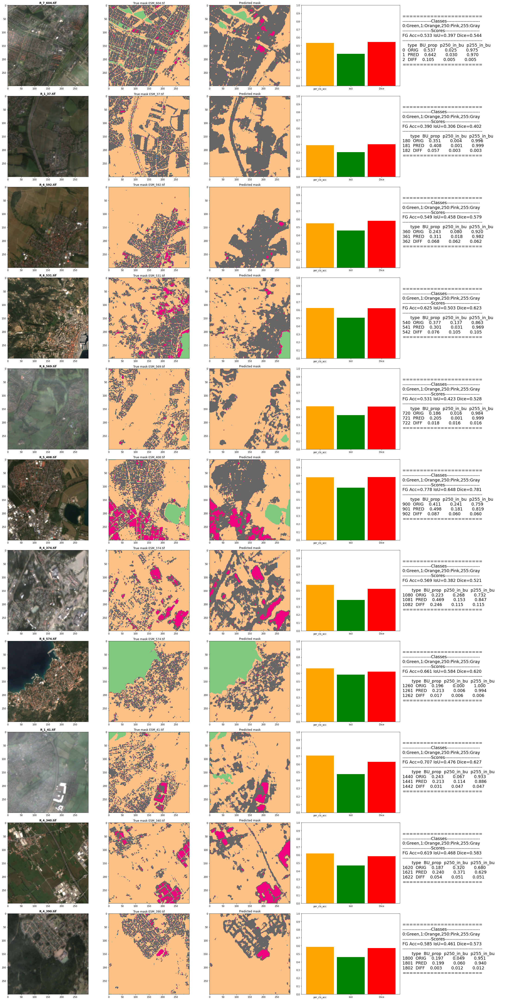

In [ ]:
plot_final_results(train_fnames,preds,pred_prop_df,s2_resized,esm_aligned,show_every=60)

In [ ]:
df_new_mask_class_counts = pd.DataFrame(columns=['0','1','2','3'])
for pred_mask in preds[0]:
  pred_arx = pred_mask.argmax(dim=0)
  add_cls_counts(df_new_mask_class_counts,pred_arx,classes_dic={'0':0,'1':0,'2':0,'3':0})

In [ ]:
# om=pd.read_csv('orig_masks_bu_area.csv',index_col=0,header=None)
# classes = ['0','1','250','255']
# om=pd.read_csv('orig_masks_bu_area_w_nodata.csv',index_col=0,header=None)
# nm=get_bu_area_ratio(df_new_mask_class_counts,with_no_data=True)
# nm=get_bu_area_ratio(df_new_mask_class_counts)
om=orig_only_df[BU_PROP]
nm=pred_only_df[BU_PROP]
len(om),len(nm)

(650, 650)

In [ ]:
quite_good = abs(nm.values.reshape(len(nm))-om.values.reshape(len(om)))<BEST_THRESH
good_ones =  abs((nm.values.reshape(len(nm))-om.values.reshape(len(om)))<=0.15)
worst= (abs(nm.values.reshape(len(nm))-om.values.reshape(len(om)))>WORST_THRESH)
sum(quite_good),sum(good_ones),sum(worst)

(307, 580, 9)

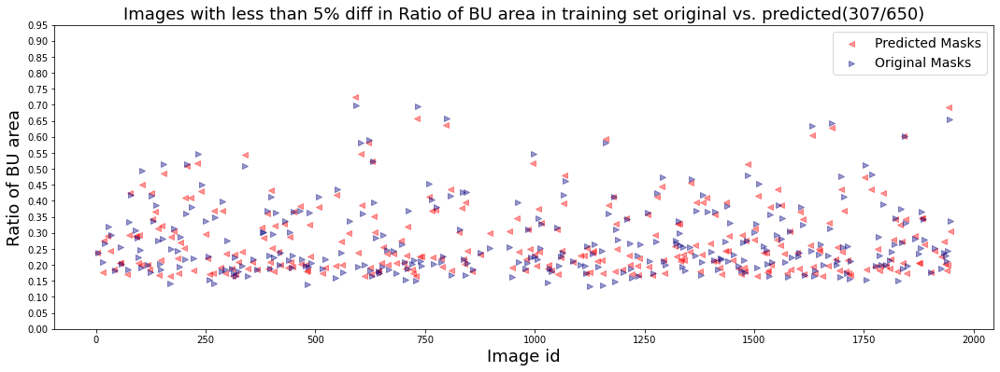

In [ ]:
#TODO move to libs
def plot_scatter_diff(orig_df,pred_df,title,filter_index,thresh,vl=False):
  f,ax1 = plt.subplots(1,1,figsize=(18,6))
  x1=orig_df[filter_index].index
  y1=orig_df[filter_index].values
  ax1.scatter(x1,y1,alpha=0.4,marker='<',color='red')

  x2=pred_df[filter_index].index
  y2=pred_df[filter_index].values
  ax1.scatter(x2,y2,alpha=0.4,marker='>',color='navy')
  ax1.set_xlabel('Image id',fontsize=18)
  ax1.set_ylabel('Ratio of BU area',fontsize=18)
  ax1.set_yticks(np.arange(0, 1, 0.05))
  if(vl):
    ax1.vlines(x1[0], y1[0], y2[0], linestyles='dotted')
  ax1.set_title(title.format(int(thresh*100),len(x2),len(orig_df)),fontsize=18)
  plt.legend({'Original Masks','Predicted Masks'},fontsize=14)
  plt.show()

plot_scatter_diff(om,nm,'Images with less than {}% diff in Ratio of BU area in training set original vs. predicted({}/{})',quite_good,BEST_THRESH)

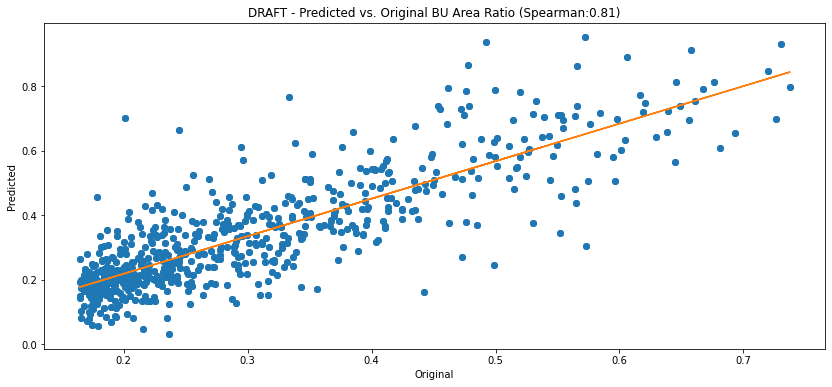

In [ ]:
#TODO add a line plot - diagonal is the orig, and predicted scattered
from scipy import stats
_,ax0 = plt.subplots(1,1,figsize=(14,6))
# ax0.plot([0, 1], [0, 1], ls="--")
ident = [min(min(om),min(nm)), max(max(om),max(nm))]
# plt.plot(ident,ident,ls='--',color='r')
ax0.scatter(om,nm)
ax0.set_xlabel('Original')
ax0.set_ylabel('Predicted')
spr_corr = stats.spearmanr(om,nm)
m, b = np.polyfit(om, nm, 1)
#best fit line
ax0.plot(om, nm, 'o')
ax0.plot(om, m*om + b)
plt.title('DRAFT - Predicted vs. Original BU Area Ratio (Spearman:{:.2f})'.format(spr_corr[0]))
# plt.legend()
plt.show()

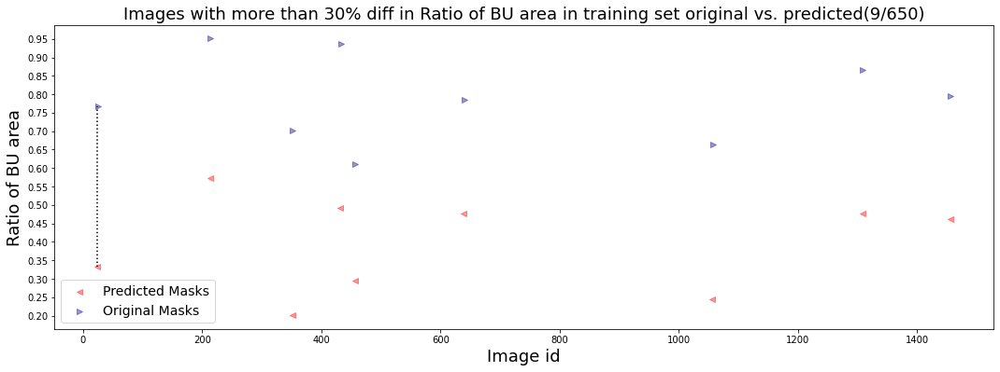

In [ ]:
plot_scatter_diff(om,nm,'Images with more than {}% diff in Ratio of BU area in training set original vs. predicted({}/{})',worst,WORST_THRESH,vl=True)

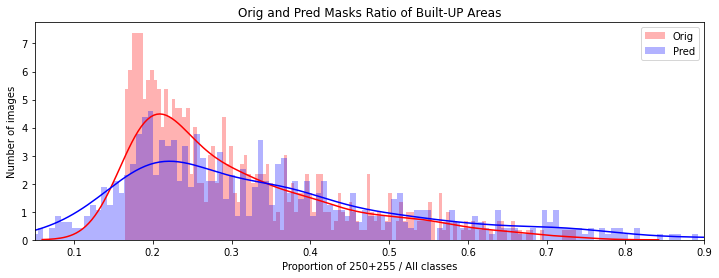

In [ ]:
f,ax1 = plt.subplots(1,1,figsize=(12,4))
plot_hist(om,None,ax1,'Red',lbl='Orig')
plot_hist(nm,'Orig and Pred Masks Ratio of Built-UP Areas',ax1,'Blue',lbl='Pred')
plt.show()

In [ ]:
# orig_pred_diff_df = pd.DataFrame(columns=['orig','pred','abs_diff'],dtype=float)
# orig_pred_diff_df['orig'] = orig_only_df.BU_prop
# orig_pred_diff_df['pred'] = pred_only_df.BU_prop
# orig_pred_diff_df['abs_diff'] = diff_only_df.BU_prop
# sorted(list(orig_pred_diff_df.sort_values(by='abs_diff',ascending=False)[:5].index))==sorted(list(orig_pred_diff_df[worse].index)),orig_pred_diff_df.sort_values(by='abs_diff',ascending=False)[:1]
# orig_pred_diff_df

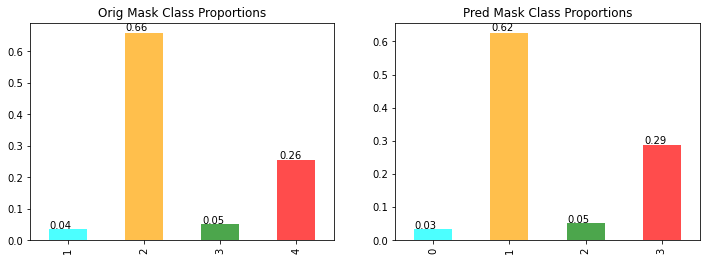

In [ ]:
f,(ax1,ax2) = plt.subplots(1,2,figsize=(12,4))

df_orig_mask_class_counts = pd.read_csv('df_orig_mask_class_counts.csv',index_col=0,header=None)

plot_bar(df_orig_mask_class_counts,'Orig Mask Class Proportions',ax1)
annotate(ax1)

plot_bar(df_new_mask_class_counts,'Pred Mask Class Proportions',ax2)
annotate(ax2)
plt.show()

## Look at some **not great** training examples

Mostly of dense BU areas!

In [ ]:
orig_only_df[worst]

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
24,ORIG,R_6_543.tif,ESM_543.tif,639,59363,17223,12775,0.333311,0.574138,0.425862
213,ORIG,R_4_330.tif,ESM_330.tif,446,38092,1136,50326,0.571800,0.022075,0.977925
351,ORIG,R_6_511.tif,ESM_511.tif,7966,63910,679,17445,0.201378,0.037464,0.962536
432,ORIG,R_6_516.tif,ESM_516.tif,1307,44374,10197,34122,0.492433,0.230082,0.769918
456,ORIG,R_2_196.tif,ESM_196.tif,707,62803,5023,21467,0.294333,0.189619,0.810381
639,ORIG,R_7_687.tif,ESM_687.tif,559,46618,1670,41153,0.475811,0.038998,0.961002
1056,ORIG,R_2_102.tif,ESM_102.tif,202,67795,168,21835,0.244478,0.007635,0.992365
1308,ORIG,R_3_211.tif,ESM_211.tif,293,46705,7376,35626,0.477800,0.171527,0.828473
1455,ORIG,R_2_180.tif,ESM_180.tif,530,47916,12980,28574,0.461711,0.312365,0.687635


In [ ]:
worst_df = diff_only_df[worst]
worst_df

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
26,DIFF,R_6_543.tif,ESM_543.tif,576.0,38512.0,47094.0,8006.0,0.434311,0.356832,0.356832
215,DIFF,R_4_330.tif,ESM_330.tif,409.0,33705.0,1476.0,32638.0,0.379044,0.008448,0.008448
353,DIFF,R_6_511.tif,ESM_511.tif,1616.0,46727.0,34722.0,10389.0,0.501233,0.522368,0.522368
434,DIFF,R_6_516.tif,ESM_516.tif,555.0,39445.0,25327.0,14673.0,0.444444,0.191223,0.191223
458,DIFF,R_2_196.tif,ESM_196.tif,628.0,27891.0,13261.0,15258.0,0.316878,0.142763,0.142763
641,DIFF,R_7_687.tif,ESM_687.tif,525.0,27365.0,856.0,28746.0,0.309889,0.027486,0.027486
1058,DIFF,R_2_102.tif,ESM_102.tif,109.0,37792.0,429.0,37254.0,0.418700,0.002367,0.002367
1310,DIFF,R_3_211.tif,ESM_211.tif,272.0,34619.0,25748.0,9143.0,0.387678,0.253723,0.253723
1457,DIFF,R_2_180.tif,ESM_180.tif,444.0,29614.0,24301.0,5757.0,0.333978,0.208232,0.208232


9 Worst training examples:
 ['R_6_543.tif', 'R_4_330.tif', 'R_6_511.tif', 'R_6_516.tif', 'R_2_196.tif', 'R_7_687.tif', 'R_2_102.tif', 'R_3_211.tif', 'R_2_180.tif']


  0%|          | 0/8 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


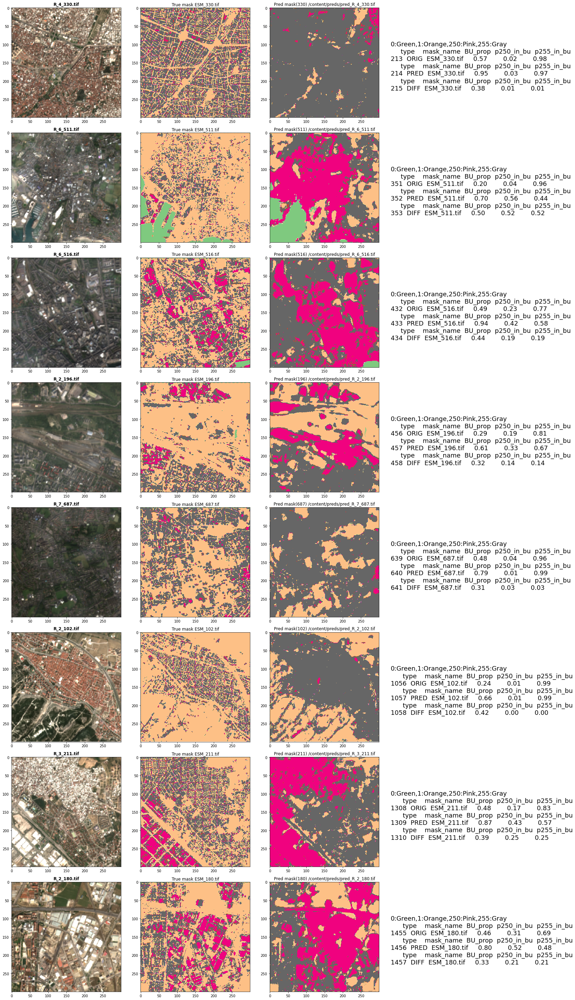

In [ ]:
#TODO move final version to libs

def get_file_name_id(img_path):
  spl = img_path.split('/')
  fname = spl[0]
  fid   = spl[0].split('.')[0].split('_')[-1]
  return fname,fid
# get_file_name_id('R_3_211.tif')

def plot_worst_samples(worst_df,orig_only_df,pred_only_df,s2_resized,esm_aligned,preds_dir,code2class):
  not_gr8_fnames=worst_df['image_name']
  print(sum(worst),'Worst training examples:\n',list(not_gr8_fnames))
  f,axes = plt.subplots(len(worst_df)-1,4,figsize=(24,40))

  j=0
  for i in tqdm(range(1,len(not_gr8_fnames))):
    img_fn = not_gr8_fnames.iloc[i]
    img_fname,img_id = get_file_name_id(img_fn)
    src_img_path = glob.glob('{}/{}'.format(s2_resized,img_fname))[0]
    # img_fname=get_file_name(src_img_path)

    src_msk_path = get_matching_mask_path(img_fname,mask_dir=preds_dir)
    prd_msk_path = glob.glob('{}/pred*{}.tif'.format(preds_dir,img_id))[0]

    with rio.open(src_img_path) as matching_image:
      show(normalize(matching_image.read([3,2,1])),ax=axes[j,0],title=img_fname)
      msk = get_msk(src_msk_path,esm_aligned,code2class)
      show(msk,ax=axes[j,1],cmap=cm)

      msk_name = get_matching_mask_path(img_fname, esm_aligned).split(os.path.sep)[-1]
      axes[j,1].set_title('True mask ' + msk_name)
      
      prd_msk = np.array(PILMask.create(prd_msk_path))

      show(prd_msk,ax=axes[j,2],cmap=cm)
      axes[j,2].set_title('Pred mask({}) {}'.format(img_id,prd_msk_path))

      axes[j,3].axis('off')
      with pd.option_context('display.float_format', '{:.2f}'.format):

        colls=['type','mask_name',BU_PROP,	c250_IN_BU	,c255_IN_BU]
        axes[j,3].text(0.0, 0.25,'0:Green,1:Orange,250:Pink,255:Gray\n{}\n{}\n{}'.format(
            orig_only_df[orig_only_df['image_name']==img_fname][colls],
            pred_only_df[pred_only_df['image_name']==img_fname][colls],
            worst_df[worst_df['image_name']==img_fname][colls]),fontsize=18)

      j+=1
  plt.tight_layout()
  

plot_worst_samples(worst_df,orig_only_df,pred_only_df,s2_resized,esm_aligned,PREDS_DIR,code2class)

## Inference on unseen images (TEST)

+ Saving predictions to a folder

In [ ]:
test_fnames = get_image_files(S2_TEST_DIR)

dl = learn.dls.test_dl(test_fnames)
test_preds = learn.get_preds(dl=dl)
test_preds[0].shape

torch.Size([50, 4, 300, 300])

In [ ]:
pred_test_prop_df = build_proportions_df(test_fnames,test_preds[0],ESM_TEST_DIR,code2class)
pred_test_prop_df.head(6)

0it [00:00, ?it/s]

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
0,ORIG,R_5_476.tif,ESM_476.tif,5373,65080,784,18763,0.217189,0.040108,0.959892
1,PRED,R_5_476.tif,ESM_476.tif,5293,76448,398,7861,0.091767,0.048190,0.951810
2,DIFF,R_5_476.tif,ESM_476.tif,80.0,11368.0,386.0,10902.0,0.125422,0.008081,0.008081
3,ORIG,R_4_300.tif,ESM_300.tif,9336,44412,6223,30029,0.402800,0.171659,0.828341
4,PRED,R_4_300.tif,ESM_300.tif,9034,31648,2579,46739,0.547978,0.052293,0.947707
5,DIFF,R_4_300.tif,ESM_300.tif,302.0,12764.0,3644.0,16710.0,0.145178,0.119366,0.119366


In [ ]:
test_orig_only_df = pred_test_prop_df.where(pred_test_prop_df['type']=='ORIG').dropna()
test_pred_only_df = pred_test_prop_df.where(pred_test_prop_df['type']=='PRED').dropna()
test_diff_only_df = pred_test_prop_df.where(pred_test_prop_df['type']=='DIFF').dropna()
display(test_diff_only_df.describe())
sum(test_diff_only_df.BU_prop > WORST_THRESH),display(test_diff_only_df.head())

,BU_prop,p250_in_bu,p255_in_bu
count,50.000000,50.000000,50.000000
mean,0.082611,0.065062,0.065062
std,0.074798,0.076712,0.076712
min,0.002400,0.000863,0.000863
25%,0.016050,0.008661,0.008661
50%,0.060800,0.037474,0.037474
75%,0.123689,0.105962,0.105962
max,0.312700,0.360338,0.360338


,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
2,DIFF,R_5_476.tif,ESM_476.tif,80.0,11368.0,386.0,10902.0,0.125422,0.008081,0.008081
5,DIFF,R_4_300.tif,ESM_300.tif,302.0,12764.0,3644.0,16710.0,0.145178,0.119366,0.119366
8,DIFF,R_7_677.tif,ESM_677.tif,280.0,1365.0,204.0,881.0,0.012056,0.001592,0.001592
11,DIFF,R_5_492.tif,ESM_492.tif,949.0,16842.0,8446.0,26237.0,0.197678,0.151911,0.151911
14,DIFF,R_7_647.tif,ESM_647.tif,380.0,2874.0,366.0,2128.0,0.027711,0.012162,0.012162


(1, None)

In [ ]:
test_om=test_orig_only_df[BU_PROP]
test_nm=test_pred_only_df[BU_PROP]
len(test_om),len(test_nm)

(50, 50)

  0%|          | 0/50 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

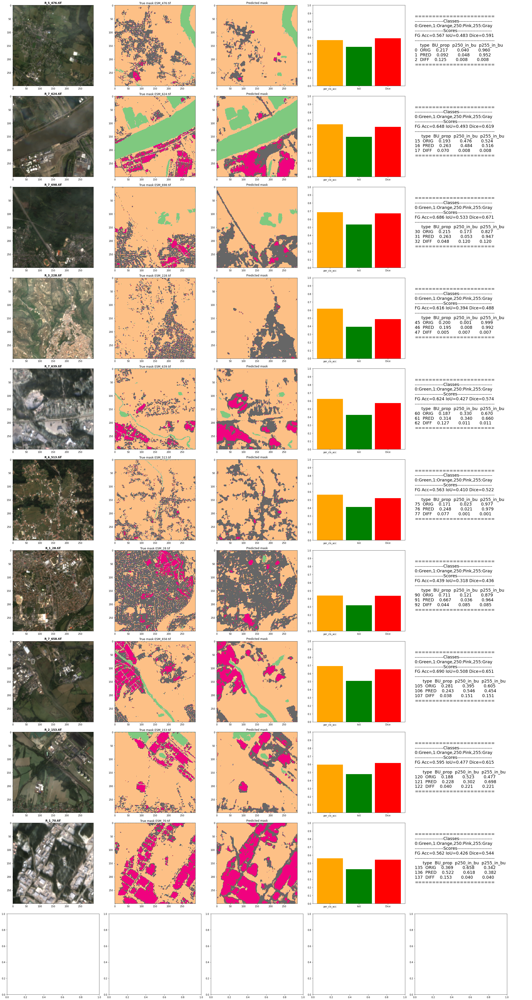

In [ ]:
plot_final_results(test_fnames,test_preds,pred_test_prop_df,S2_TEST_DIR,ESM_TEST_DIR)

We can see that when the color bars are higer than Dice~0.6 the quality of the preciction is not bad
The Absolute error is the sum of the error precentage for all classes
The Absolute Foreground error is the sum of the error precentage for 250,255
We can see for some images (such R_7_685.tif or R_1_61.tif), where the "no data" was covering some real 250 and 255 - the model was able to predict them quite well...

In [ ]:
TEST_WORST_THRESH=.15
test_quite_good = abs(test_nm.values.reshape(len(test_nm))-test_om.values.reshape(len(test_om)))<BEST_THRESH
# test_good_ones =  abs((test_nm.values.reshape(len(test_nm))-test_om.values.reshape(len(test_om)))<=0.25)
test_worst= (abs(test_nm.values.reshape(len(test_nm))-test_om.values.reshape(len(test_om)))>TEST_WORST_THRESH)
sum(test_quite_good),sum(test_worst)#sum(test_good_ones),

(21, 9)

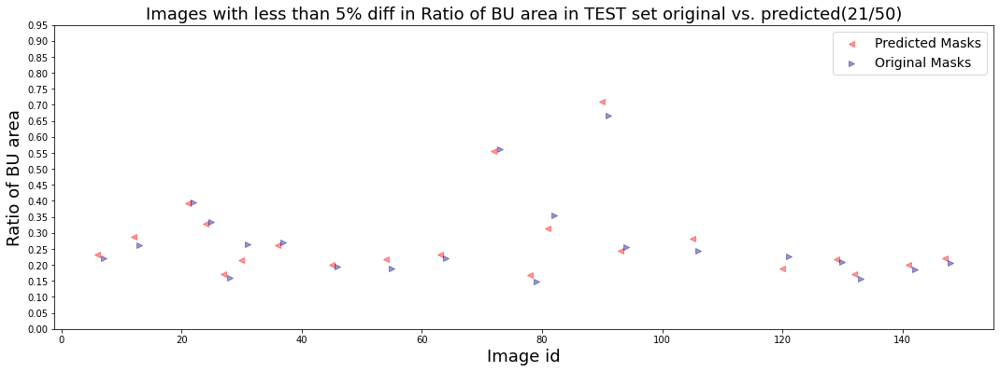

In [ ]:
plot_scatter_diff(test_om,test_nm,'Images with less than {}% diff in Ratio of BU area in TEST set original vs. predicted({}/{})',test_quite_good,BEST_THRESH)

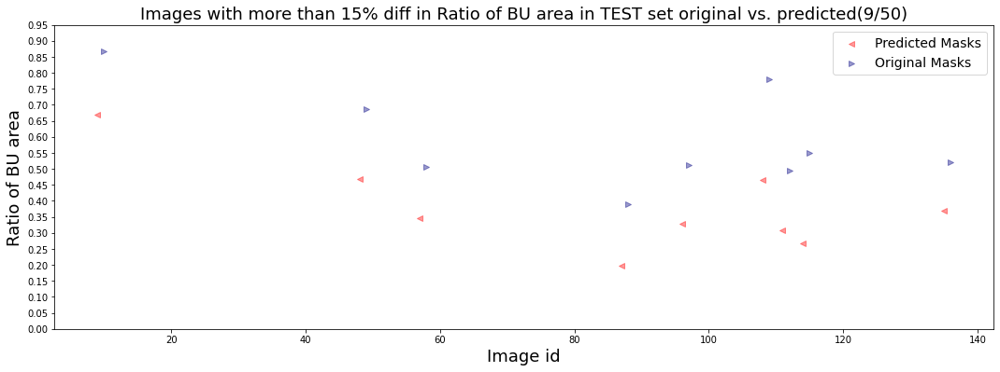

In [ ]:
plot_scatter_diff(test_om,test_nm,'Images with more than {}% diff in Ratio of BU area in TEST set original vs. predicted({}/{})',test_worst,TEST_WORST_THRESH)

In [ ]:
test_worst_df = test_diff_only_df[test_worst]
test_worst_df

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
11,DIFF,R_5_492.tif,ESM_492.tif,949.0,16842.0,8446.0,26237.0,0.197678,0.151911,0.151911
50,DIFF,R_4_324.tif,ESM_324.tif,523.0,18912.0,1180.0,20615.0,0.215944,0.046027,0.046027
59,DIFF,R_4_309.tif,ESM_309.tif,381.0,14241.0,17353.0,2731.0,0.162467,0.225325,0.225325
89,DIFF,R_3_272.tif,ESM_272.tif,4569.0,21794.0,16684.0,541.0,0.191389,0.360338,0.360338
98,DIFF,R_7_680.tif,ESM_680.tif,1074.0,15452.0,7585.0,8941.0,0.183622,0.054892,0.054892
110,DIFF,R_2_137.tif,ESM_137.tif,92.0,28051.0,42.0,28101.0,0.312700,0.004850,0.004850
113,DIFF,R_4_398.tif,ESM_398.tif,243.0,16594.0,842.0,17679.0,0.187078,0.039195,0.039195
116,DIFF,R_2_111.tif,ESM_111.tif,158.0,25363.0,183.0,25338.0,0.283567,0.018265,0.018265
137,DIFF,R_1_70.tif,ESM_70.tif,246.0,13551.0,7204.0,6593.0,0.153300,0.040003,0.040003


"Worst" Test Predictions

9 Worst training examples:
 ['R_5_492.tif', 'R_4_324.tif', 'R_4_309.tif', 'R_3_272.tif', 'R_7_680.tif', 'R_2_137.tif', 'R_4_398.tif', 'R_2_111.tif', 'R_1_70.tif']


  0%|          | 0/8 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


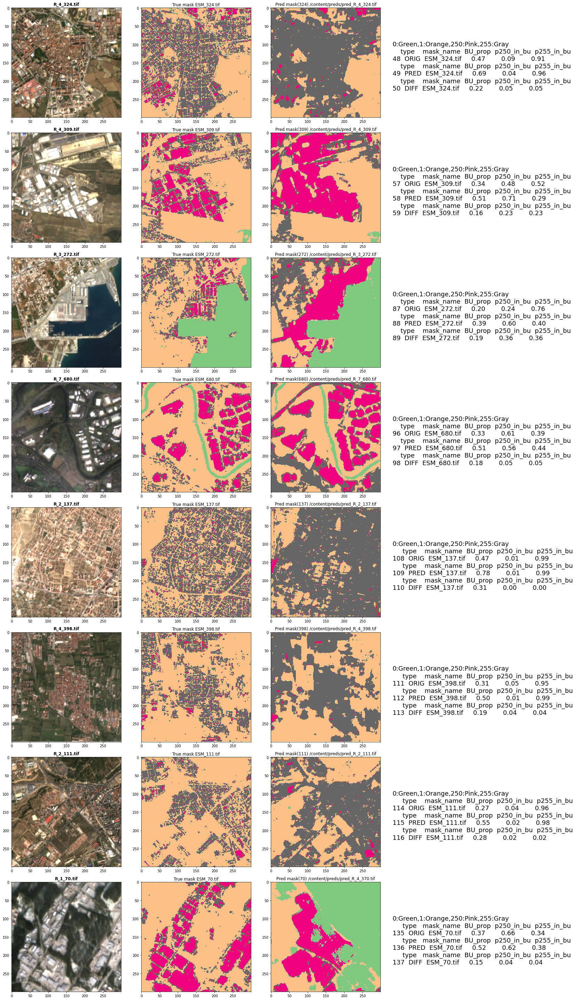

In [ ]:
plot_worst_samples(test_worst_df,test_orig_only_df,test_pred_only_df,S2_TEST_DIR,ESM_TEST_DIR,PREDS_DIR,code2class)

In [ ]:
#Predicted Mask - Per pixel probability for class 0
test_preds[0][0][0]

TensorBase([[0.3993, 0.3783, 0.3156,  ..., 0.4193, 0.3450, 0.3672],
        [0.3611, 0.2762, 0.1677,  ..., 0.2543, 0.2883, 0.3789],
        [0.3496, 0.1800, 0.0703,  ..., 0.1760, 0.2272, 0.3537],
        ...,
        [0.3803, 0.1785, 0.0470,  ..., 0.1886, 0.1741, 0.2738],
        [0.3414, 0.2285, 0.1911,  ..., 0.2523, 0.2976, 0.3372],
        [0.3326, 0.2928, 0.2672,  ..., 0.2922, 0.3044, 0.3178]])

In [ ]:
#Predicted Mask - Per pixel probability for class 1
test_preds[0][0][1]

TensorBase([[0.3427, 0.3813, 0.5153,  ..., 0.3312, 0.3631, 0.3111],
        [0.3560, 0.4728, 0.6280,  ..., 0.4705, 0.4483, 0.3340],
        [0.4158, 0.5755, 0.7771,  ..., 0.5603, 0.4653, 0.3715],
        ...,
        [0.3783, 0.5197, 0.5718,  ..., 0.4249, 0.3988, 0.3140],
        [0.3558, 0.4299, 0.4262,  ..., 0.4102, 0.3020, 0.2633],
        [0.3305, 0.3816, 0.3629,  ..., 0.3638, 0.2790, 0.2513]])

In [ ]:
#Predicted Mask - Per pixel probability for class 250
test_preds[0][0][2]

TensorBase([[0.0628, 0.0395, 0.0154,  ..., 0.0411, 0.0678, 0.1273],
        [0.0555, 0.0261, 0.0111,  ..., 0.0210, 0.0326, 0.0809],
        [0.0320, 0.0157, 0.0126,  ..., 0.0179, 0.0261, 0.0621],
        ...,
        [0.0388, 0.0255, 0.0304,  ..., 0.0554, 0.0876, 0.1153],
        [0.0435, 0.0298, 0.0451,  ..., 0.0491, 0.0937, 0.1146],
        [0.0536, 0.0430, 0.0625,  ..., 0.0859, 0.1349, 0.1399]])

In [ ]:
#Predicted Mask - Per pixel probability for class 255
test_preds[0][0][3]

TensorBase([[0.1953, 0.2009, 0.1537,  ..., 0.2085, 0.2241, 0.1944],
        [0.2273, 0.2250, 0.1931,  ..., 0.2542, 0.2307, 0.2061],
        [0.2026, 0.2288, 0.1401,  ..., 0.2457, 0.2814, 0.2127],
        ...,
        [0.2026, 0.2763, 0.3509,  ..., 0.3311, 0.3395, 0.2970],
        [0.2593, 0.3118, 0.3377,  ..., 0.2884, 0.3066, 0.2849],
        [0.2833, 0.2826, 0.3074,  ..., 0.2581, 0.2818, 0.2910]])

In [ ]:
# pred_prop_df.to_csv('train_pred_prop_df.csv',index=False)
pred_prop_df.head(2)

,type,image_name,mask_name,0,1,250,255,BU_prop,p250_in_bu,p255_in_bu
0,ORIG,R_7_604.tif,ESM_604.tif,5796,35853,1185,47166,0.537233,0.024508,0.975492
1,PRED,R_7_604.tif,ESM_604.tif,2730,29511,1726,56033,0.641767,0.029883,0.970117


In [ ]:
def as_int(df):
  df[0] = df[0].astype(int)
  df[1] = df[1].astype(int)
  df[250] = df[250].astype(int)
  df[255] = df[255].astype(int)
  return df

orig_only_df=as_int(orig_only_df)
pred_only_df=as_int(pred_only_df)
diff_only_df=as_int(diff_only_df)


## Calculate confidence intervals for the test data results

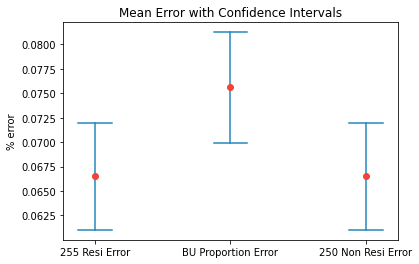

In [ ]:
import matplotlib.pyplot as plt
import statistics
from math import sqrt


def plot_confidence_interval(x, values, z=1.96, color='#2187bb', horizontal_line_width=0.25):
    mean = statistics.mean(values)
    stdev = statistics.stdev(values)
    confidence_interval = z * stdev / sqrt(len(values))
  
    left = x - horizontal_line_width / 2
    top = mean - confidence_interval
    right = x + horizontal_line_width / 2
    bottom = mean + confidence_interval
    plt.plot([x, x], [top, bottom], color=color)
    plt.plot([left, right], [top, top], color=color)
    plt.plot([left, right], [bottom, bottom], color=color)
    plt.plot(x, mean, 'o', color='#f44336')
    plt.ylabel('% error')

    return mean, confidence_interval


plt.xticks([1, 2, 3, 4], ['255 Resi Error', 'BU Proportion Error', '250 Non Resi Error'])
plt.title('Mean Error with Confidence Intervals')
plot_confidence_interval(1, diff_only_df[c255_IN_BU])
plot_confidence_interval(2, diff_only_df[BU_PROP])
plot_confidence_interval(3, diff_only_df[c250_IN_BU])
# plot_confidence_interval(4, [30, 31, 42, 45, 44])
plt.show()

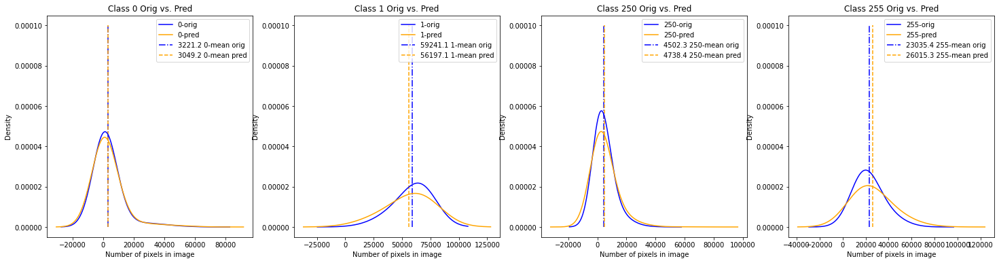

In [ ]:
#TODO DRAFT - fix yticks

f,axs = plt.subplots(1,4,figsize=(25,6))
for i,c in enumerate([0,1,250,255]):
  orig_only_df[c].plot.density(ax=axs[i],title='Class {} Orig vs. Pred'.format(c),color='b',bw_method=1,label='{}-orig'.format(c))
  axs[i].vlines(orig_only_df[c].mean(),0,0.0001,linestyle='-.',label='{:.1f} {}-mean orig'.format(orig_only_df[c].mean(),c),color='b')
  pred_only_df[c].plot.density(ax=axs[i],color='orange',bw_method=1,label='{}-pred'.format(c))
  axs[i].vlines(pred_only_df[c].mean(),0,0.0001,linestyle='--',label='{:.1f} {}-mean pred'.format(pred_only_df[c].mean(),c),color='orange')
  axs[i].set_xlabel('Number of pixels in image')
  axs[i].legend()


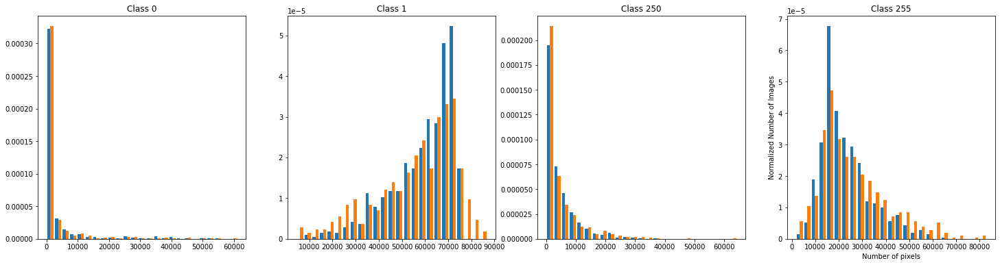

In [ ]:
#TODO DRAFT  - fix xtick yticks

x0 = list(orig_only_df[0])
x1 = list(orig_only_df[1])
x250 = list(orig_only_df[250])
x255 = list(orig_only_df[255])
px0 = list(pred_only_df[0])
px1 = list(pred_only_df[1])
px250 = list(pred_only_df[250])
px255 = list(pred_only_df[255])

# Assign colors for each airline and the names
colors = ['blue', 'red', 'green', 'orange', 'cyan','purple','black','pink']
names = ['orig_0','orig_1','orig_250','orig_255','pred_0','pred_1','pred_250','pred_255']


f,axs = plt.subplots(1,4,figsize=(25,6))
for i,c in enumerate([0,1,250,255]):      
  axs[i].hist([orig_only_df[c], pred_only_df[c]], bins = 25,    label=names,density=True)

  # plt.legend()
  plt.xlabel('Number of pixels')
  plt.ylabel('Normalized Number of Images')
  axs[i].set_title('Class {}'.format(c))


In [ ]:
import math
#1.96=95% #1.64=90% #2.33=98% #2.58=99%
def calc_conf_intervals(error,z=1.96,title='na'):
  n=len(error)
  mean_error=np.mean(error)
  # print(error)
  interval = z * math.sqrt( (mean_error * (1 - mean_error)) / n)
  lower = mean_error-interval
  upper = mean_error+interval
  print(title)
  print('mean=%.3f, lower=%.3f, upper=%.3f' % (mean_error,lower, upper))
  # return mean_error,lower,upper
calc_conf_intervals(diff_only_df[BU_PROP],title='Mean BU Area proportion error confidence intervals:')


Mean BU Area proportion error confidence intervals:
mean=0.076, lower=0.055, upper=0.096


In [ ]:
calc_conf_intervals(diff_only_df[c250_IN_BU],title='Mean Non Residential BU Area proportion error - Confidence Intervals:')

Mean Non Residential BU Area proportion error - Confidence Intervals:
mean=0.067, lower=0.047, upper=0.086


In [ ]:
calc_conf_intervals(diff_only_df[c255_IN_BU],title='Mean Residential BU Area proportion error - Confidence Intervals:')

Mean Residential BU Area proportion error - Confidence Intervals:
mean=0.067, lower=0.047, upper=0.086


In [ ]:
!ls {PREDS_DIR} | wc -l

700


In [ ]:
#Save final model (~700MB)
# learn.export()

# learn.save(file='/content/new_last_model.pth')
# !cp /content/new_last_model.pth /content/drive/MyDrive/2022/S1/3624_Final_Project/models/
# !ls /content/drive/MyDrive/2022/S1/3624_Final_Project/models/
# !ls /content/s2_resized/../../models/new_last_model.pth

We are getting the same or better metric results as some relevant published papers, such as:
https://www.mdpi.com/2072-4292/13/12/2292/htm

Table 16. Global metrics for the experiment with UNet on UOS2 (UOS2 is made out of Sentinel-2 satellite imagery and uses 13 bands or channels per image).

| Experiment | 	OA | 	PA | 	UA | 	IoU | 	F1 | 
|------------|-----|-----|-----|------|------|
|Base|	0.647|	0.569|	0.428|	0.323|	0.489|
|6 bands|	0.569|	0.480|	0.373|	0.252|	0.420|
|13 bands|	0.589|	0.463|	0.371|	0.261|	0.412|


<br><br><br><br>
# TODOs

0. From ELI - improvement suggestions: https://link.medium.com/ENJ7uQMtxpb , pytorch version: https://github.com/sadeepj/crfasrnn_pytorch/tree/master/crfasrnn
0. review the current status and results with Yoav, and ask Alon about improvement suggestions

1. How we plan to evaluate the model Train, Validation, Test, Selection of loss metric(s) - discuss

3. Try other architechtures (DeepLab(yes) https://github.com/rushi-the-neural-arch/Research-Paper-Implementation/blob/master/DeepLab%20(Semantic%20seg)/Deeplab_Segmentation.ipynb  , ~maskRCNN (no)~

4. do we need to normalize the input data ? 
5. Save final models for inference
6. to leverage pretrained networks try to use only 3 channels (RGB was used in this papar: https://arxiv.org/pdf/2003.02899.pdf)


# DONE

0. ~fix show_batch to show the overlay of mask on the image...~ **DONE** use the "display_image()" or "show()" on the same axis

1. ~**Augmentations**~

  ~1.1 read a good paper about this for Sat images and try to adopt some **DONE** used Albumenations~
  
2. ~**class Imbalance** - calculate 250+255 / (1+0+250+255) for all dataset - should be between 0.17 and 0.84 ratio (Yoav did when exported) - **DONE**~

3. ~Print on predictions the class % and legend proportions of classes **DONE**~

4. ~Use Dice, IoU, SSIM - intersection over union - **DONE**~

5. ~**Image similarity** - possible to use a network VGG or Inception to test that , MSE is not good, for example: GitHub - idealo/imagededup https://github.com/idealo/imagededup - requires to save files and preds in a directory... **inconvinient...**~

6. ~**Projection transformation**: cubic and blinear, it is possible to try them - **DONE** doesn't work well - as it changes the dimensions of the images - kept the **"Resampling.Nearest"**~

7. ~PREPROCESSING: Suggestions for 2 additional combined channels:~

- ~NDVI https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/ndvi/ (**DONE**)~

- ~NDBI https://custom-scripts.sentinel-hub.com/#sentinel-2 (**Band missing**)~

8. ~Save output images ?~ **DONE**

9. ~show predictions on test in the triples at the end~ **DONE**

10. ~**“Start from the beginning“** log results of experiments and plots~ partially done in ["analysis notebook" ](https://colab.research.google.com/drive/1TS3NE9uXq7fLFI6dtBsHyYxtkZQcmlQL?usp=sharing)

  10.1 ~Show that BCE (without class weights) is not a good loss first (class imbalance), then try other losses~ DONE in ["analysis notebook" ](https://colab.research.google.com/drive/1TS3NE9uXq7fLFI6dtBsHyYxtkZQcmlQL?usp=sharing)

References:

Some code snippets and inspiration:

https://gist.github.com/jaeeolma/0846e03c0c3b613212f8ca5824ae47e0

https://github.com/muellerzr/Practical-Deep-Learning-for-Coders-2.0/blob/master/Computer%20Vision/07_Binary_Segmentation.ipynb

[Semantic Segmentation for Edge Detection](file:///C:/Users/liadl/Desktop/remotesensing-14-00613-v2.pdf)

Focal Loss paper : https://arxiv.org/pdf/1708.02002.pdf

Paper with metric results on S2: https://www.mdpi.com/2072-4292/13/12/2292/htm

Combined Focal and Dice loss: https://arxiv.org/abs/2102.04525


# Mom - next steps:

- more data of problemtic areas ??? not yet
- replace 250 255 to human readble captions
-legend of human readible - in report of TRIOs
-explain the metric we used
-post processing of roads
-Overfit-->expand architechture add parameters - expand Conv dimenstions
-Try DeepLabv3+
-Try also basic losses
- try to reduce some channels (less features)
- regression - not to use decoder part
